In [4]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')
p_features_cut=cuts['p_features_cut'][0]

# Task 02: Could this be a disk viewed edge-on?
Previous task: 

Task 01: Is the galaxy smooth or featured? (need to answer features)

Task 12: Does the galaxy have a mostly clumpy appearance? (need to answer no) 

In [9]:
#First define the task in question:
p_edgeon_yes = 't02_edgeon_a01_yes_weighted_fraction' # vote fraction for task
N_edgeon = 't02_edgeon_total_weight' # number of votes for task
#and the previous task vote fractions:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
p_clumpy_no = 't12_clumpy_a02_no_weighted_fraction' # vote fraction for previous task
N_clumpy = 't12_clumpy_total_weight' # number of votes for previous task

#cut on p_features:
featured=(data[p_features]>p_features_cut)

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_edgeon]>=N_cut)

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_edgeon=[]
err_list_edgeon=[]


for p in p_prev_task_list:
    task_data = (data[p_clumpy_no]>p-.05) & (data[p_clumpy_no]<p+.05) & min_N & featured

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_edgeon.append(np.nanmean(data[task_data][p_edgeon_yes]))


    try:
        err_list_edgeon.append(np.nanstd(data[task_data][p_edgeon_yes])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_edgeon.append(0)


y1_edgeon = [f+e for f,e in zip(fraction_list_edgeon,err_list_edgeon)]
y2_edgeon = [f-e for f,e in zip(fraction_list_edgeon,err_list_edgeon)]

/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1136: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


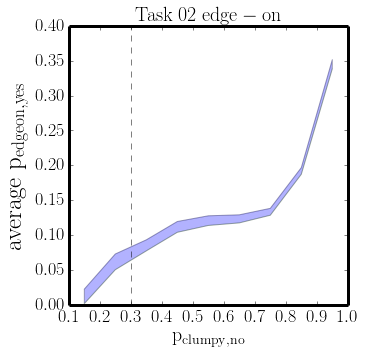

In [43]:
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

p_clumpy_no_cut = 0.3
f=plt.figure(figsize=(5,5))
gs=gridspec.GridSpec(1,1)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_edgeon,alpha=.1)
plt.plot(p_prev_task_list,y2_edgeon,alpha=.1)
plt.fill_between(p_prev_task_list,y1_edgeon,y2_edgeon,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{edgeon,yes}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{clumpy,no}}$',fontsize=20)
plt.title(r'$\mathrm{Task~02~edge-on}$',fontsize=20)
plt.axvline(x=p_clumpy_no_cut,ls='dashed',color='k',alpha=.5)


## Below: Visually inspect galaxies for "edge-on candidates" - galaxies for which asking the edge-on question makes physical sense. These should be disks.

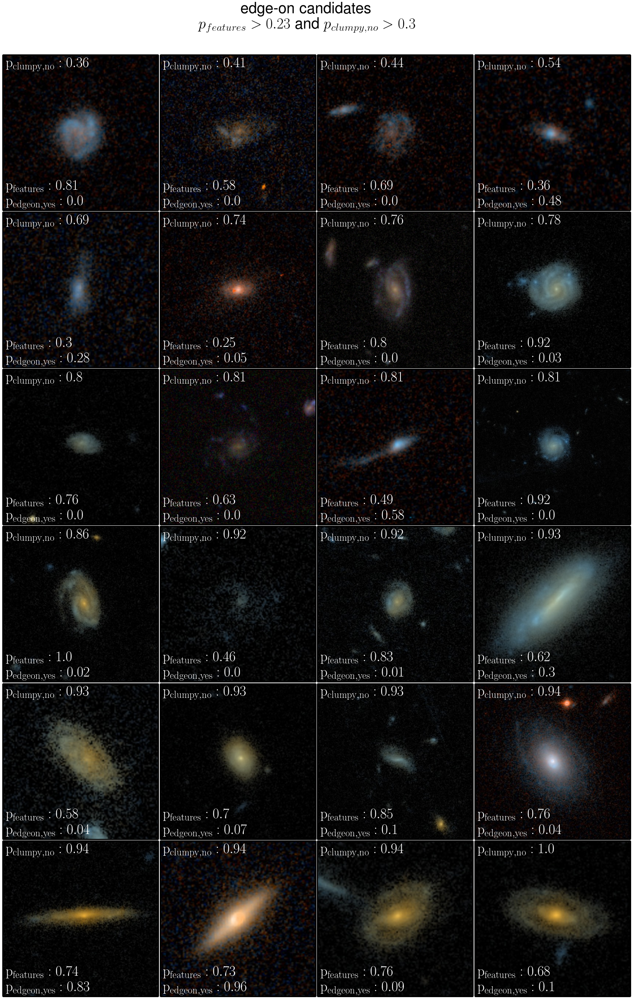

In [44]:
not_clumpy=(data[p_clumpy_no]>p_clumpy_no_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & not_clumpy & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_clumpy_no, column 113
random_gal_list.sort(key=itemgetter(113))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{clumpy,no}: %s}$'%round(gal[p_clumpy_no],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{edgeon,yes}: %s}$'%(round(gal[p_features],2),round(gal[p_edgeon_yes],2)),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'edge-on candidates\n$p_{features} > %s$~and~$p_{clumpy,no}>%s$'%(p_features_cut,p_clumpy_no_cut), fontsize=40,ha='center')





## Below: The control sample; galaxies for which asking the edgeon question does *not* make sense. These should be clumpy/irregular. 

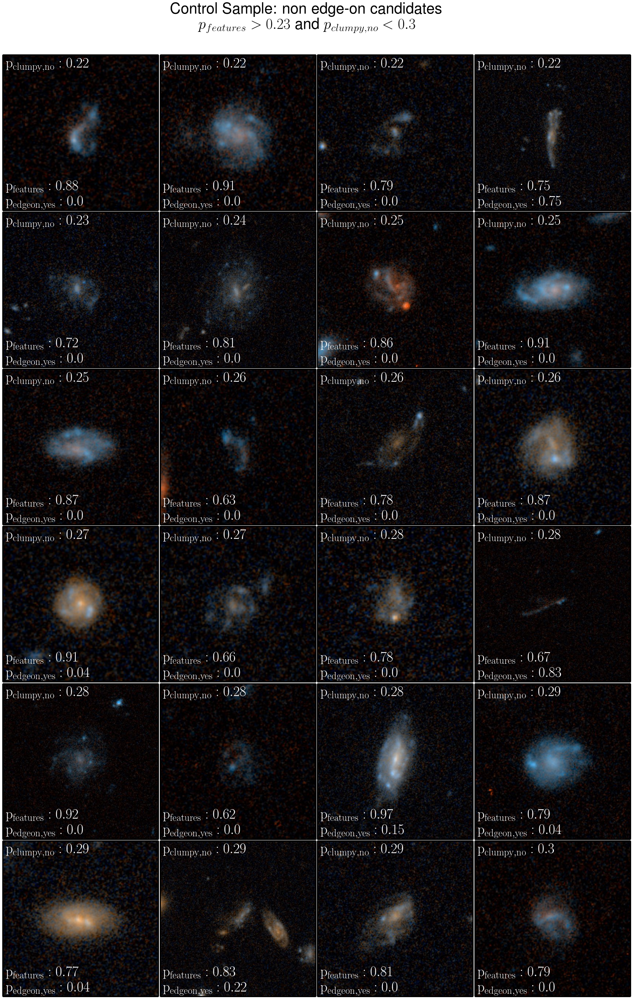

In [45]:
clumpy=(data[p_clumpy_no]<p_clumpy_no_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & clumpy & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_clumpy_no, column 113
random_gal_list.sort(key=itemgetter(113))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{clumpy,no}: %s}$'%round(gal[p_clumpy_no],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{features}: %s}$\n$\mathrm{p_{edgeon,yes}: %s}$'%(round(gal[p_features],2),round(gal[p_edgeon_yes],2)),fontsize=38,xy=(0.02,.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non edge-on candidates\n$p_{features} > %s$~and~$p_{clumpy,no}<%s$'%(p_features_cut,p_clumpy_no_cut), fontsize=40,ha='center')





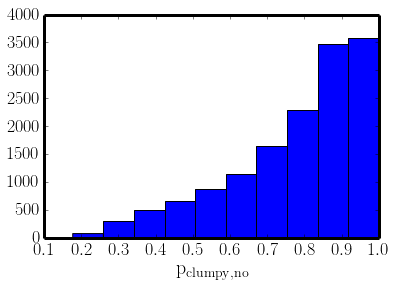

In [42]:
plt.hist(data[featured & min_N][p_clumpy_no])
plt.xlabel('$\mathrm{p_{clumpy,no}}$',fontsize=20)

## In the control sample, there are a few galaxies which I would consider edge-on candidates. But these are few, and represent less than half of the sample. Further, there are very few galaxies with p_clumpy_no < 0.3 in this set, as seen in the histogram above. So we will use p_clump_no > 0.3 as a cut for selecting potentially edgeon galaxies. 

In [46]:
cuts['p_clumpy_no_cut']=p_clumpy_no_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')